In [17]:
import pylab as plt
%pylab inline

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


In [18]:
import katdal
import katpoint
import scape
import logging
logger = logging.getLogger()
logger.setLevel(logging.ERROR)

In [19]:
#n = '/var/kat/archive/data/RTS/telescope_products/2015/12/03/1449138207.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/11/26/1448574519.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/11/26/1448581975.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/11/27/1448589427.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/11/27/1448597061.h5'
#n = '/var/kat/archive/data/RTS/telescope_products/2015/12/03/1449137265.h5'
#n= '/var/kat/archive/data/RTS/telescope_products/2015/12/03/1449140896.h5'
n = '/var/kat/archive/data/RTS/telescope_products/2016/01/29/1454033553.h5'

In [20]:
h5 = katdal.open(n,centre_freq=12500.5e6)
print h5

Name: /var/kat/archive/data/RTS/telescope_products/2016/01/29/1454033553.h5 (version 3.1)
Observer: RTS  Experiment ID: 20160128-0011
Description: 'RTS: 3.4 Interferometric_Pointing M024 Scanning'
Observed from 2016-01-29 04:12:35.021 SAST to 2016-01-29 09:55:26.319 SAST
Dump rate / period: 1.00042 Hz / 1.000 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m024,m025                            4       12
Spectral Windows: 1
  ID  Product    CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0              12500.500         856.000          4096      208.984
-------------------------------------------------------------------------------
Data selected according to the following criteria:
  subarray=0
  ants=['m025', 'm024']
  spw=0
-------------------------------------------------------------------------------
Shape: (20580 dumps, 4096 channels, 12 correlation products) => Size: 8.092 GB
Antennas: m024,*m025  Inputs: 4  Autocorr: yes  Crosscor

In [21]:
N = len(h5.compscan_indices)
print N

45


In [22]:
h5.select(scans='~slew',channels=slice(1024,1024+2048),corrprods = 'cross')
print h5.compscan_indices


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE
HERE


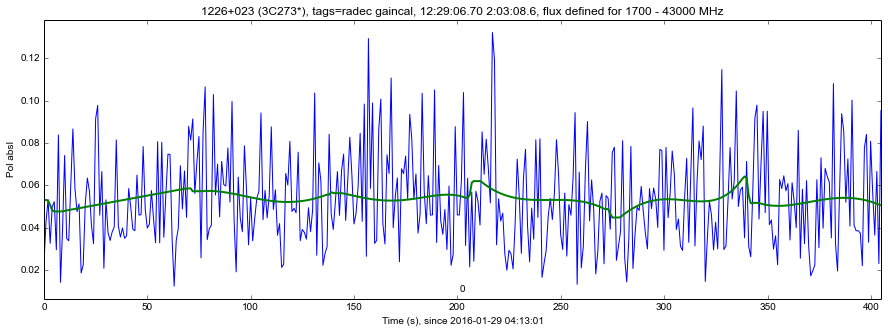

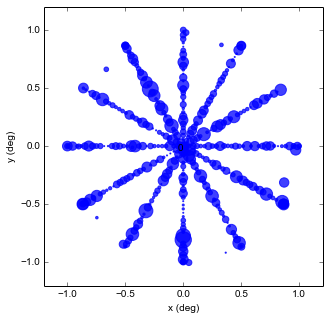

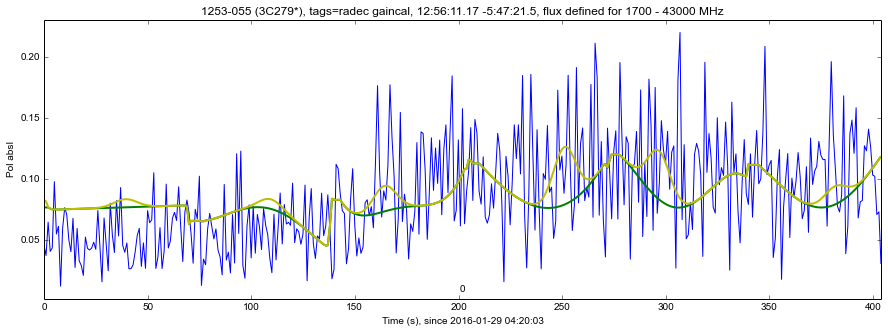

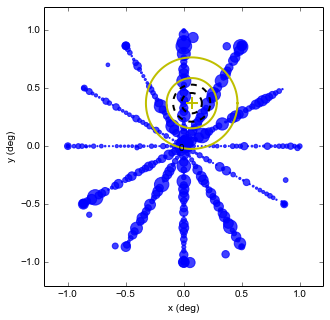

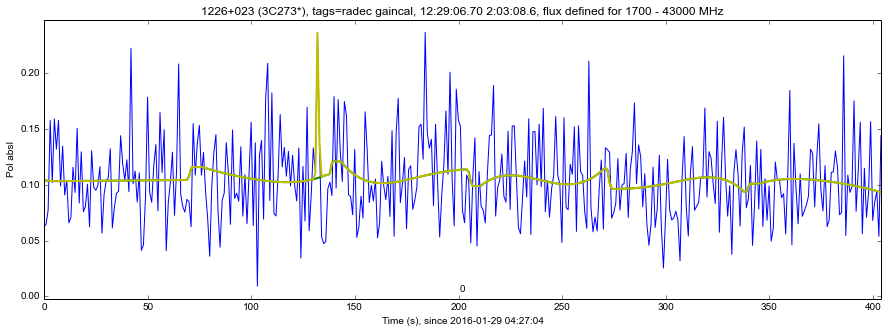

...

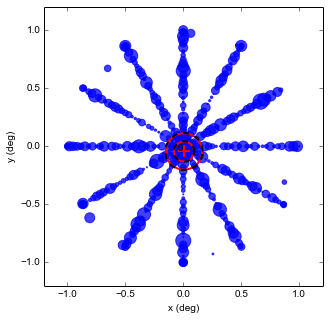

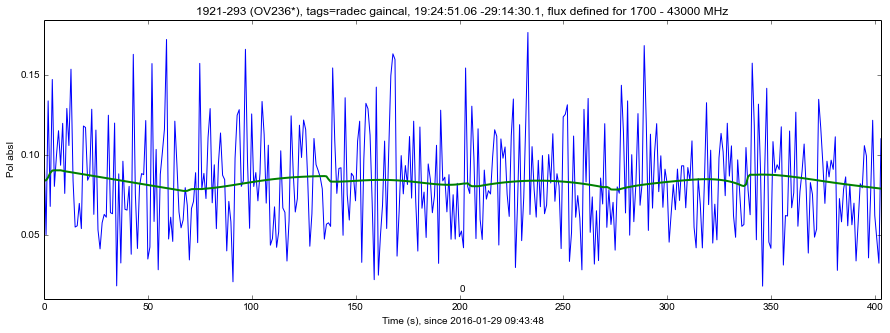

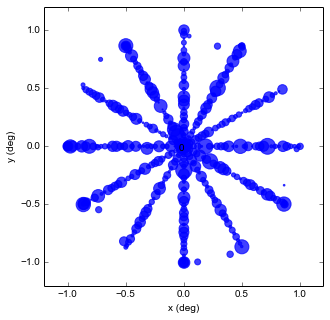

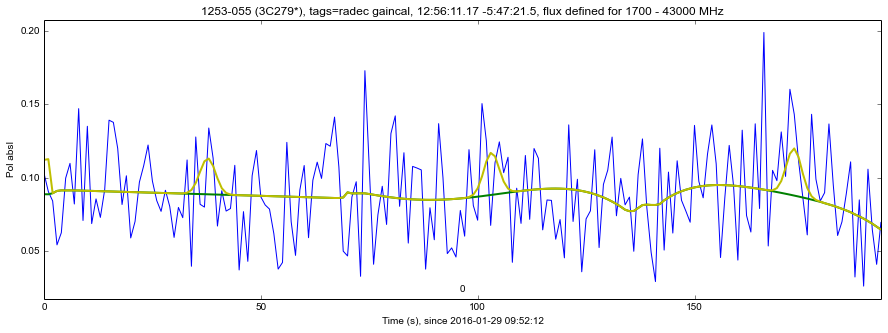

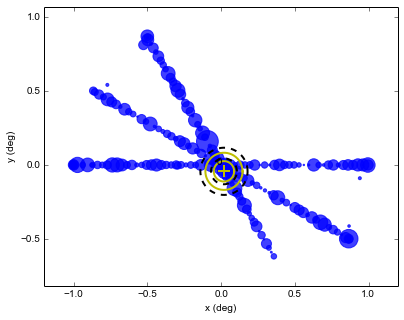

In [23]:

h5.select()
ants = h5.ants
N = len(h5.compscan_indices)
h5.select(scans='track,scan',channels=slice(1024,1024+2048),corrprods = 'cross')
print h5.compscan_indices
for c in h5.compscans():
    d = scape.DataSet(h5,baseline = 'm024,m025')
    #for i in range(len(d.scans)):
    #    d.scans[i].data = scape.stats.remove_spikes(d.scans[i].data,axis=1,spike_width=3,outlier_sigma=5.)    
    d.average()
    print "HERE"
    d.fit_beams_and_baselines()
    plt.figure(figsize=(15,5))
    scape.plot_compound_scan_in_time(d.compscans[0])
    #pl_title = str(d.compscans[0].target) + '. Compscan %d in %d'%(c[0],N)  '. Beamfit valid: %s'%str(d.compscans[0].beam.is_valid) 
    pl_title = str(d.compscans[0].target)
    plt.title(pl_title)
    plt.figure(figsize=(15,5))
    scape.plot_compound_scan_on_target(d.compscans[0])
    #print pl_title, d.compscans[0].beam.center

In [24]:
d=scape.DataSet(h5,baseline = 'm024,m025')
d

<scape.DataSet '20160128-0011' baseline='m024 - m025' compscans=45 at 0x7f6facf499d0>

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]
1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz. Compscan 0 in 45. Beamfit valid: True [  7.98541020e-05  -4.91763111e-05]
1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz. Compscan 1 in 45. Beamfit valid: True [  1.61190644e-05  -4.18016662e-05]
1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz. Compscan 2 in 45. Beamfit valid: True [  7.76638975e-05  -4.38315196e-05]
1253-055 (3C279*), tags=radec gaincal, 12:56:11.17 -5:47:21.5, flux defined for 1700 - 43000 MHz. Compscan 3 in 45. Beamfit valid: True [  6.32982701e-05  -5.82714600e-05]
1226+023 (3C273*), tags=radec gaincal, 12:29:06.70 2:03:08.6, flux defined for 1700 - 43000 MHz. Compscan 4 in 45. Beamfit valid: True [  3.096

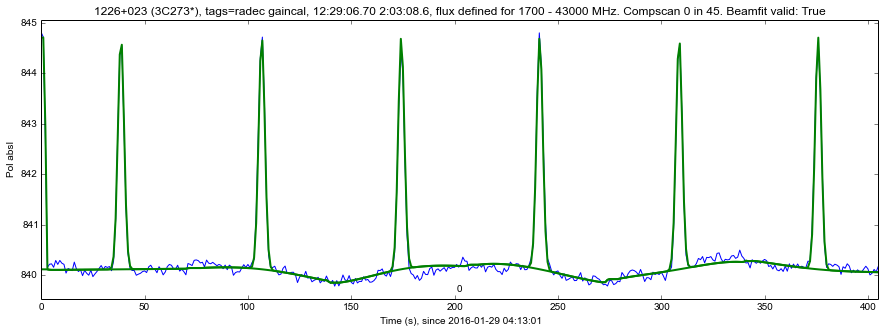

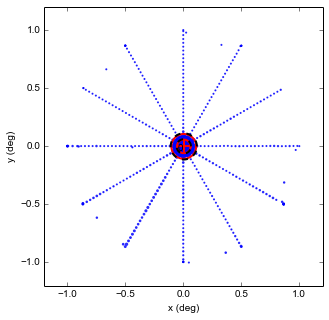

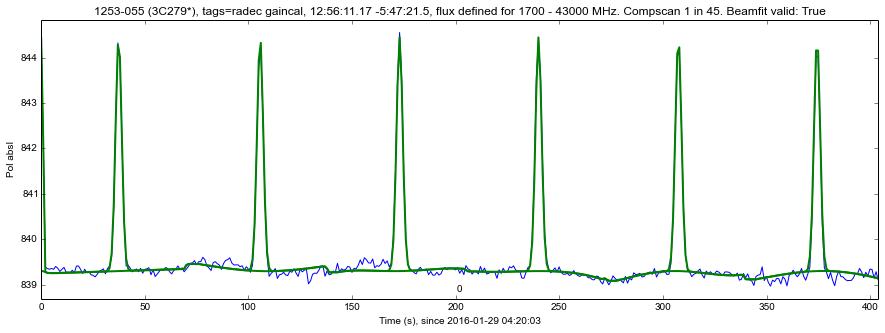

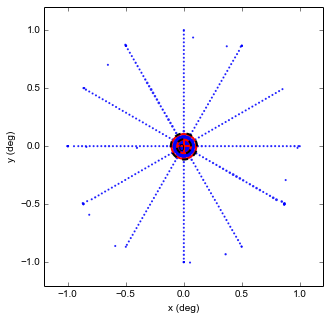

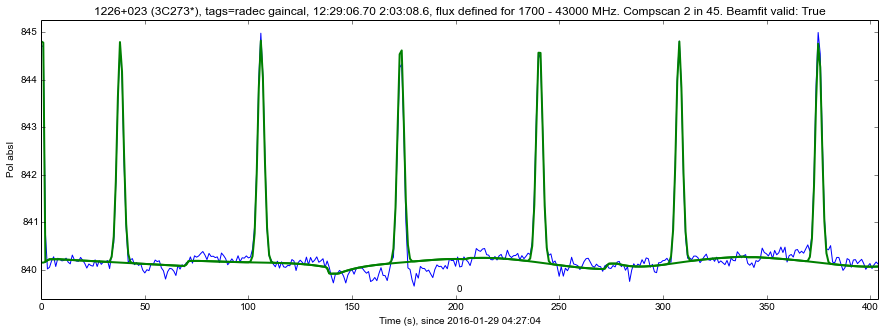

...

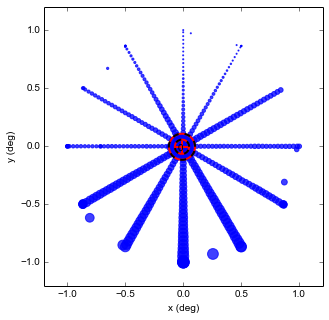

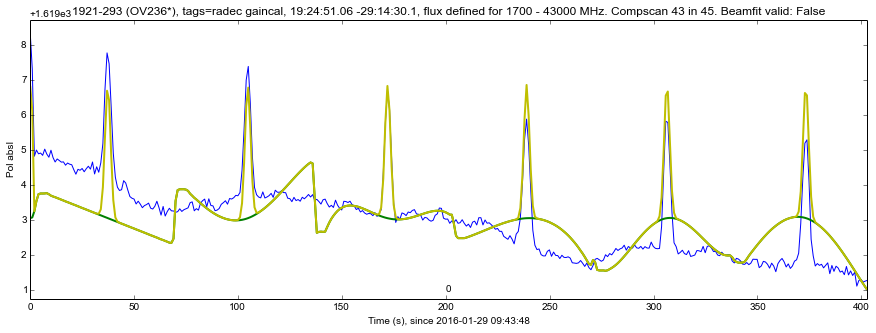

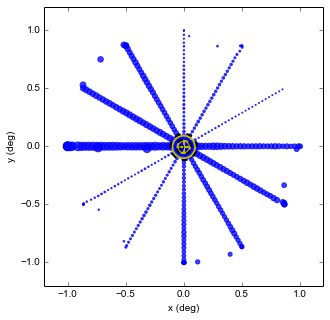

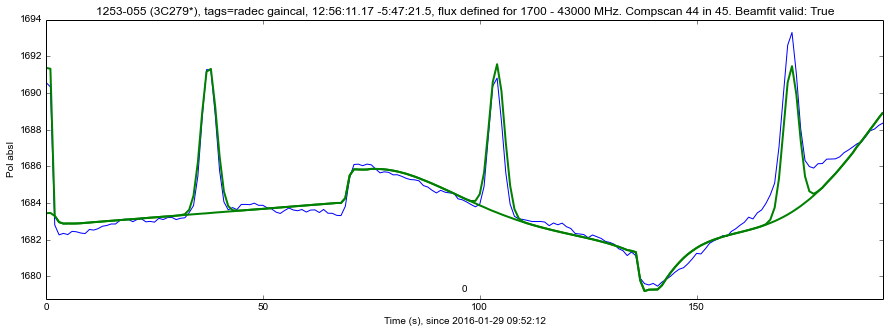

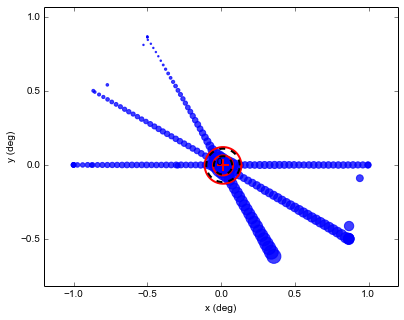

In [26]:

h5.select()
ants = h5.ants
N = len(h5.compscan_indices)
h5.select(scans='track,scan',channels=slice(1024,1024+2048),ants='m024')
print h5.compscan_indices
for c in h5.compscans():
    d = scape.DataSet(h5)
    #for i in range(len(d.scans)):
    #    d.scans[i].data = scape.stats.remove_spikes(d.scans[i].data,axis=1,spike_width=3,outlier_sigma=5.)    
    d.average()
    d.fit_beams_and_baselines()
    figure(figsize=(15,5))
    scape.plot_compound_scan_in_time(d.compscans[0])
    pl_title = str(d.compscans[0].target) + '. Compscan %d in %d'%(c[0],N) + '. Beamfit valid: %s'%str(d.compscans[0].beam.is_valid) 
    title(pl_title)
    figure(figsize=(15,5))
    scape.plot_compound_scan_on_target(d.compscans[0])
    print pl_title, d.compscans[0].beam.center

In [ ]:
x= d.compscans[0]
x.beam.is_valid